http://www.ok.sc.e.titech.ac.jp/res/DM/RI.pdf

In [1]:
import imageio
import numpy as np
import os
from PIL import Image
from tqdm import tqdm

import bayer
from debayering import demosaicking

input_path = 'data/'
output_path = 'output/'

for file in tqdm(os.listdir(input_path)):
    original_image = imageio.imread(input_path + file)
    
    #loose data by creating bayer cfa
    bayer_image = bayer.create_bayer_image(original_image, show=False)
    
    #restore data
    restored_image = demosaicking(bayer_image)
    
    img = Image.fromarray(restored_image, mode='RGB')
    img.save(output_path + "restored_" + file + ".jpeg")

100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:40<00:00,  1.69s/it]


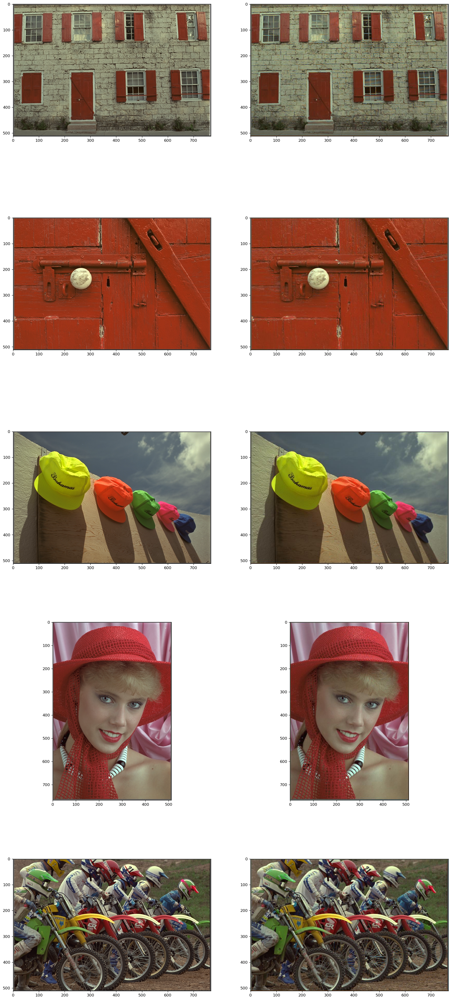

In [2]:
#examples:
import matplotlib.pyplot as plt

files = os.listdir(input_path)
n = len(files) + 1

f = plt.figure(figsize=(20, 10*n), dpi=120)
f.tight_layout()

for i, file in enumerate(files[:5]):
    original_image = imageio.imread(input_path + file)
    restored_image = imageio.imread(output_path + "restored_" + file + ".jpeg")
    
    f.add_subplot(n, 2, 2*i+1)
    plt.imshow(original_image)

    f.add_subplot(n, 2, 2*i+2)
    plt.imshow(restored_image)
plt.show(block=True)

